# Make a software package for generating train/test data

+ Utilities for combining models / directional forcing
+ 

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
from numpy.random import random, seed, normal
import glob
import os.path

from mpl_toolkits.mplot3d import axes3d

import scipy

from chaos_ensemble import *
from utils import *

blue, red, turquoise, purple, magenta, orange  = [[0.372549, 0.596078, 1], [1.0, .3882, .2784], 
                                 [0.20784314, 0.67843137, 0.6], [0.59607843, 0.25882353, 0.89019608],
                                         [0.803922, 0.0627451, 0.462745], [0.917647, 0.682353, 0.105882]]

from sklearn.metrics import accuracy_score, balanced_accuracy_score

%matplotlib inline
# %matplotlib widget
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [172]:
has_numba = True


from numba.typed import Dict, List
from numba.types import float64, unicode_type

class DynSys:
    """
    A dynamical systems class, which stores parameter
    values in a fast format for numba
    - params : list, parameter values for the differential equations
    """
    def __init__(self, params):
        if has_numba:
            self.param_vals = List()
        else:
            self.param_vals = list()
        [self.param_vals.append(item) for item in params]   

    def __call__(self, X, t):
        return self.dyneq(X, t, self.param_vals)

class Lorenz2(DynSys):
    """
    Simulate the dynamics of the Lorenz equations
    - sigma : float, the Prandtl number
    - rho : float, the Rayleigh number
    - beta : float, the spatial scale
    """
    def __init__(self, sigma=10., rho=28., beta=2.667):
        self.params = [sigma, rho, beta]
        self.sigma, self.rho, self.beta = self.params
        super().__init__(self.params)
        
    @staticmethod
    @jit(nopython=True)
    def dyneq(X, t, params):
        x, y, z = X[0], X[1], X[2]
        sigma, rho, beta = params[0], params[1], params[2]
        xdot = sigma*(y - x)
        ydot = x*(rho - z) - y
        zdot = x*y - beta*z
        return (xdot, ydot, zdot)

  


In [ ]:
import sdepy

eqf = lambda x, t : np.vstack([eq(item, t) for item in x]).T
eqf = lambda x, t : np.array(eq(x, t))

@sdepy.integrate
def grn_process(t, x, sigma=0.1):
    return {'dt': eqf(x, t)[None, :], 'dw': sigma}

# sol = grn_process(x0=np.array(ic)[:, None], 
#                 paths=1, 
#                 steps=1000, 
#                 vshape=3)(tpts)

# sol = grn_process(x0=np.array(ic)[:, None], 
#                 paths=1, 
#                 steps=1000, 
#                 vshape=3)(tpts)

n_genes = 3
n_cells = 10
sol = grn_process(x0=np.random.random((n_genes, n_cells)) - 0.5, 
                paths=n_cells, 
                steps=1000, 
                vshape=n_genes)(fine_tvals)

## Make Lorenz Ensemble for classification

In [9]:
def generate_lorenz_ensemble(tpts0, n_samples, params, frac_perturb_param=.1, 
                             n_classes=2, frac_transient=0.1, 
                             ic_range=None,
                            random_state=0):
    """
    Generate an ensemble of trajectories with random initial conditions, labelled by different
    sets of parameters.
    
    tpts : the timesteps over which to run the simulation
    params : iterable, the starting values for the parameters
    n_samples : int, the number of different initial conditons
    n_classes : int , the number of different parameters
    frac_perturb_param : float, the amount to perturb the parameters by
    frac_transient : float, the fraction of time for the time series to settle onto the attractor
    ic_range : a starting value for the initial conditions
    random_state : int, the seed for the random number generator
    """
    np.random.seed(random_state)
    
    ntpts = len(tpts0)
    dt = tpts0[1] - tpts0[0]
    t_range = tpts0[-1] - tpts0[0]
    tpts = np.arange(tpts0[0], tpts0[0] + t_range*(1 + frac_transient), dt)
    
    num_per_class = int(n_samples/n_classes)

    all_params = list()
    all_samples = list()
    for i in range(n_classes):
    
        params_perturb = 1 + frac_perturb_param*(2*np.random.random(len(params)) - 1)
        params_prime = params*params_perturb
        all_params.append(params_prime)
    
        eq = Lorenz(*params_prime)
        
        all_samples_per_class = list()
        for j in range(num_per_class):
            ic_prime = (-8.60632853, -14.85273055,  15.53352487)*np.random.random(3)
            sol = integrate_dyn(eq, ic_prime, tpts)
            
            all_samples_per_class.append(sol[:, -ntpts:]) # remove transient
        all_samples.append(all_samples_per_class)
    
    all_samples, all_params = np.array(all_samples), np.array(all_params)
    return all_samples, all_params
    
num_samples = 120

data, labels = generate_lorenz_ensemble(np.linspace(0, 500, 125000), 2*num_samples, (10, 28, 2.5), 
                                    n_classes=8, frac_perturb_param=.2, frac_transient=.2)


In [ ]:
def add_default(a,*args):
    return Adder.__dict__['add_default'](a,*args)

add_default_fast = jit(add_default,forceobj=True)
print(add_default_fast(a,7, 8)) # 16

# Sprott family

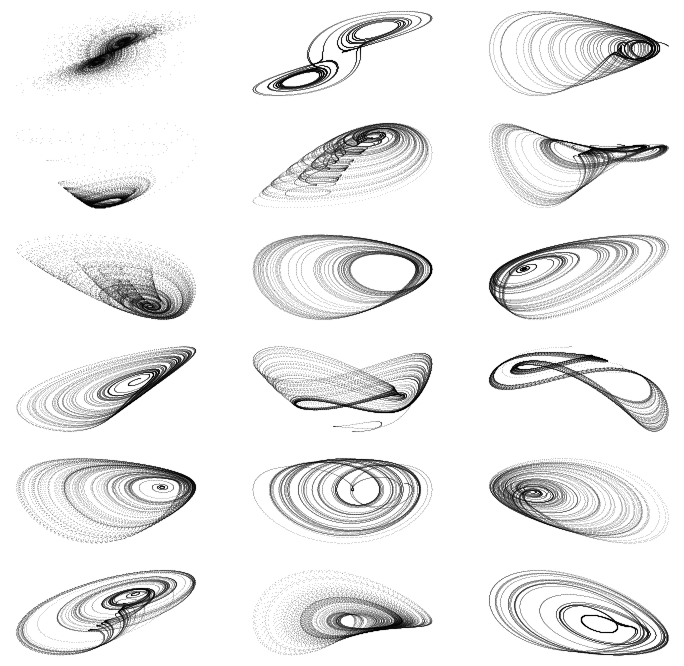

In [141]:
tpts = np.linspace(0, 2000, 20000)
ic = (.1, .1, .1)

np.random.seed(0)
all_ensembles = list()
plt.figure(figsize=(12, 12))
for i, model in enumerate([SprottB(), SprottC(), SprottD(), SprottE(), SprottF(), SprottG(), 
              SprottH(), SprottI(), SprottJ(), SprottK(), SprottL(), SprottM(),
              SprottN(), SprottO(),SprottP(), SprottQ(), SprottR(), SprottS()]):
    
    
    tpts = resample_timepoints(model, ic, tpts, pts_per_period=800)
    sol = integrate_dyn(model, ic, tpts)
    
    plt.subplot(6, 3, i+1)
    plt.plot(sol[0], sol[1], '.k', markersize=.1)

    ensemble = generate_ic_ensemble(model, tpts, 5, frac_perturb_param=.2)
    all_ensembles.append(ensemble)
    
    plt.axis('off')
    
all_ensembles = np.array(all_ensembles)
# all_ensembles.dump('all_sprott.pkl')

# Test out code

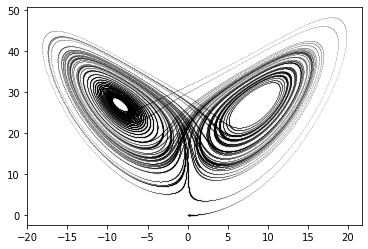

In [27]:
eq = Lorenz()
ic = (.1, .1, .1)
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000), pts_per_period=1000)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

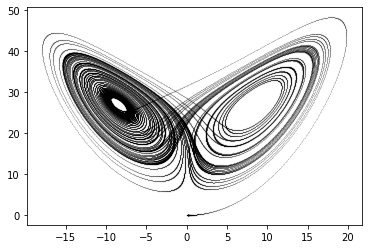

In [143]:
eq = LorenzBounded()
ic = (.1, .1, .1)
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000),  pts_per_period=1000)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

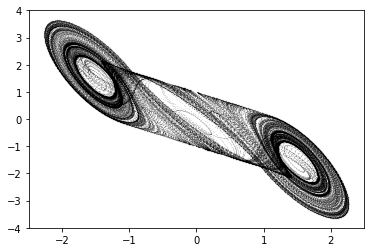

In [23]:
eq = Chua()
ic = (.1, .1, .1)
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000))
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

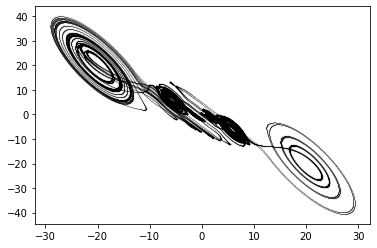

In [34]:
eq = MultiChua()
tpts = np.linspace(0, 200, 100000)
ic = (.1, -0.2, .3)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

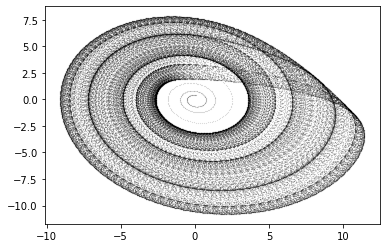

In [36]:
eq = Rossler()
tpts = np.linspace(0, 1000, 100000)
ic = (.1, .4, .1)
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000))
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

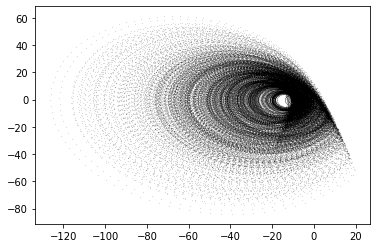

In [37]:
eq = HyperRossler()
# tpts = np.linspace(0, 1000, 100000)
ic = (-10, -6, 0, 10)
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000))
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

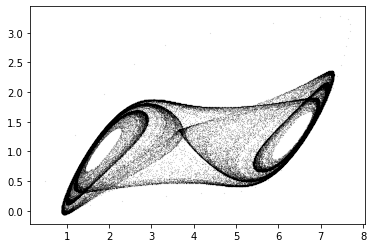

In [35]:
eq = BeerRNN()
ic = [.5,.5,.5]
tpts = resample_timepoints(eq, ic, np.linspace(0, 2000, 100000))
sol = integrate_dyn(eq, ic, tpts)
plt.plot(sol[0], sol[2], '.k', markersize=.1)

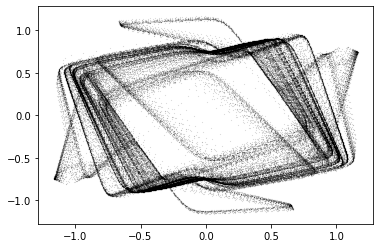

In [38]:
eq = Hopfield()
# tpts = np.linspace(0, 10000, 1000000)
ic = [1,0,0,1,0,1]
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000))
sol = integrate_dyn(eq, ic, tpts)
plt.plot(sol[0], sol[2], '.k', markersize=.1)

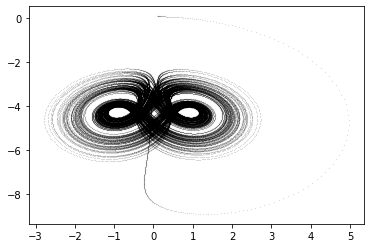

In [6]:
eq = Finance()
tpts = np.linspace(0, 1000, 100000)
ic = (.1,.1,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

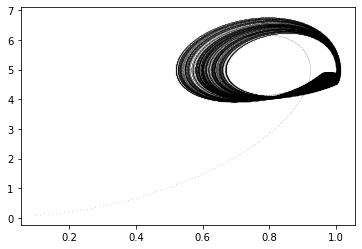

In [11]:
eq = WindmiReduced()
tpts = np.linspace(0, 1000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

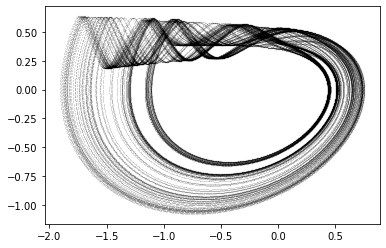

In [13]:
eq = JerkCircuit()
tpts = np.linspace(0, 1000, 100000)
ic = (.1, .4, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

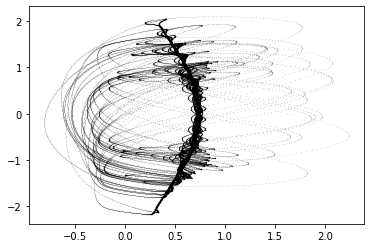

In [15]:
eq = SprottTorus()
tpts = np.linspace(0, 1000, 100000)
ic = (.1, .4, .1)
ic = (.8, .8, .8)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

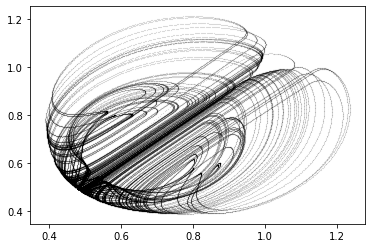

In [34]:
eq = CellCycle()
tpts = np.linspace(0, 20000, 100000)
ic = (.5,.1,.1,.51, .5, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[3], '.k', markersize=.1)

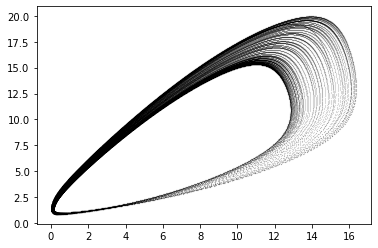

In [31]:
eq = CircadianRhythm()
tpts = np.linspace(0, 2000, 100000)
ic = (15, 15, 10, 10, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

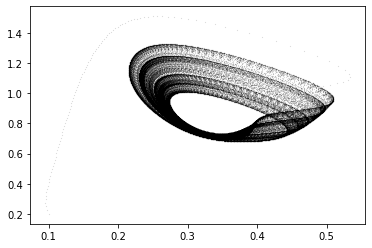

In [36]:
eq = CaTwoPlus()
tpts = np.linspace(0, 1000, 100000)
ic = (.1, .2, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

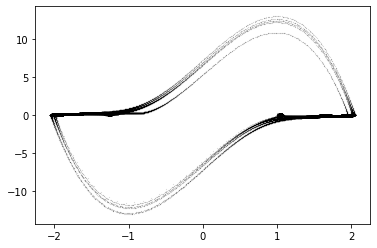

In [94]:
eq = ForcedVanDerPol()
tpts = np.linspace(0, 1000, 100000)
ic = (1,.2, 0)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

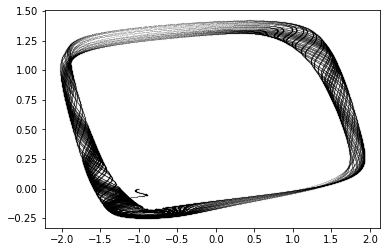

In [178]:
eq = ForcedFitzHugh(f=.25, omega=1.1)
tpts = np.linspace(0, 1000, 100000)
ic = (-1,0, 0)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

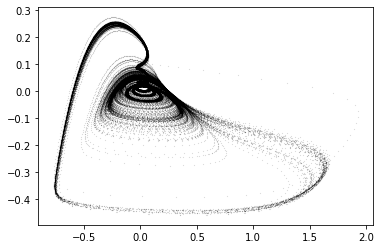

In [176]:
eq = HindmarshRose()
tpts = np.linspace(0, 1000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

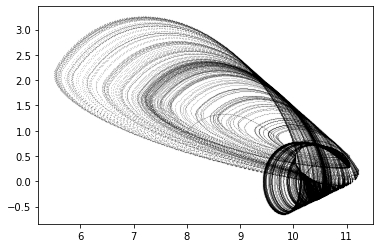

In [42]:
eq = Colpitts()
tpts = np.linspace(0, 1000, 100000)
ic = (8, 1, 10)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

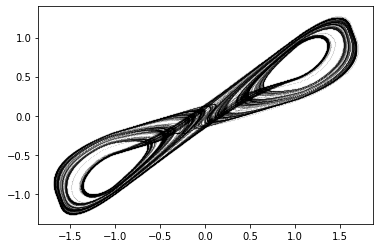

In [46]:
eq = CellularNeuralNetwork()
tpts = np.linspace(0, 1000, 100000)
ic = (.1,.1,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

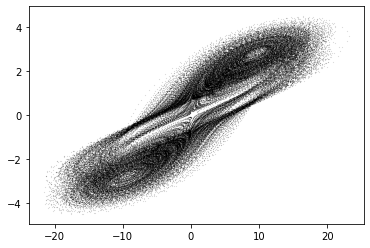

In [48]:
eq = CoupledLorenz()
tpts = np.linspace(0, 1000, 100000)
ic = (1,.2, 1, .1,.1,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[3], '.k', markersize=.1)

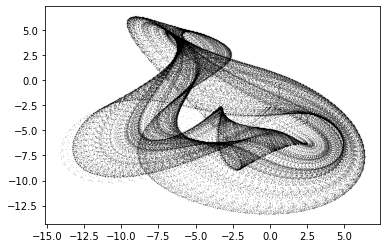

In [50]:
eq = Halvorsen()
tpts = np.linspace(0, 1000, 100000)
ic = (1,.2, 1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

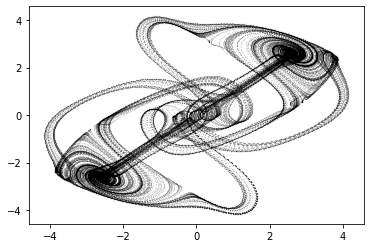

In [54]:
eq = Thomas()
tpts = np.linspace(0, 1000, 100000)
ic = (1,.2, 1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

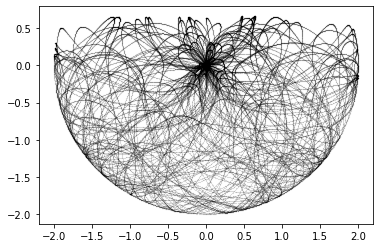

In [56]:
eq = DoublePendulum()
tpts = np.linspace(0, 100, 100000)
ic = (1, np.pi, 1, 1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(np.sin(sol[0]) + np.sin(sol[1]), -np.cos(sol[0]) - np.cos(sol[1]), '.k', markersize=.1)

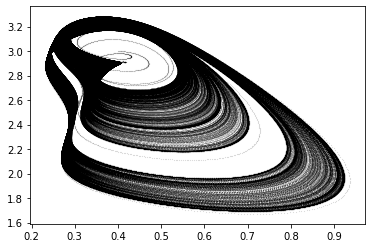

In [60]:
eq = ForcedBrusselator()
tpts = np.linspace(0, 20000, 1000000)
ic = (.4, 3,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

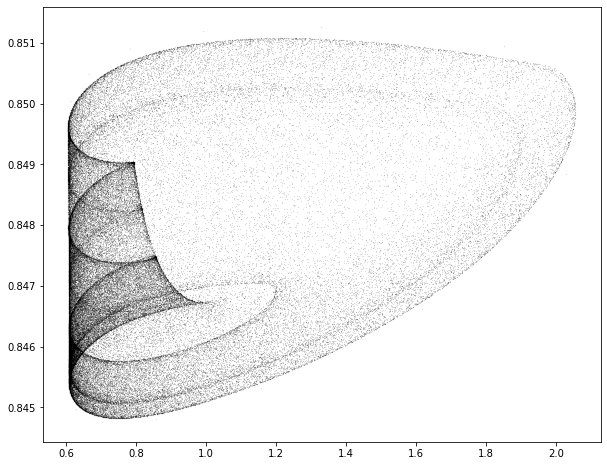

In [96]:
eq = BelousovZhabotinsky()
tpts = np.linspace(0, 200, 100000)
ic = (0.0468627, 0.8987, 0.846515)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[1], sol[2], '.k', markersize=.1)

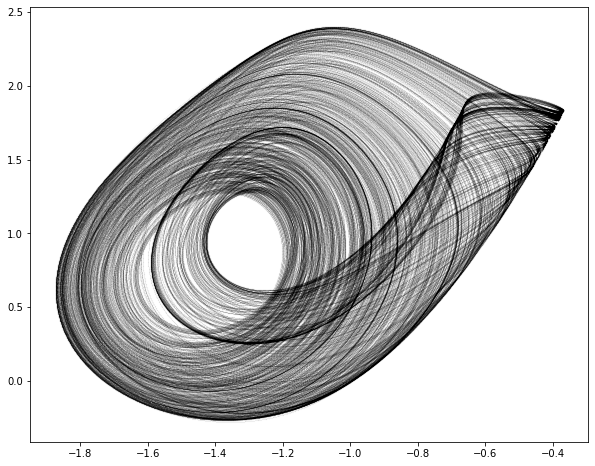

In [116]:
eq = RabinovichFabrikant()
tpts = np.linspace(0, 2000, 1000000)
ic = (-1, 0.0, 0.5)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.04)

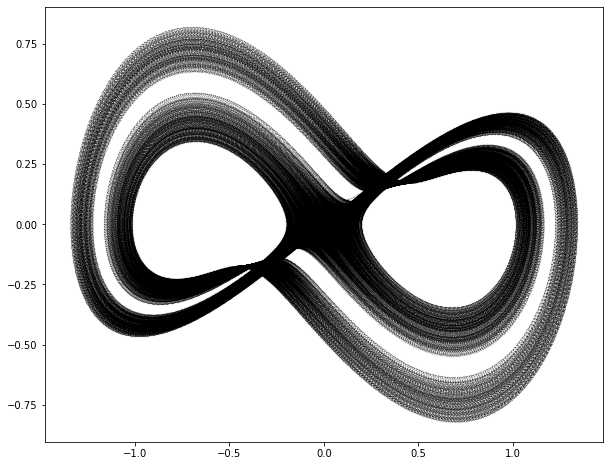

In [2]:
eq = ShimizuMorioka()
tpts = np.linspace(0, 20000, 1000000)
ic = (.1,.1,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

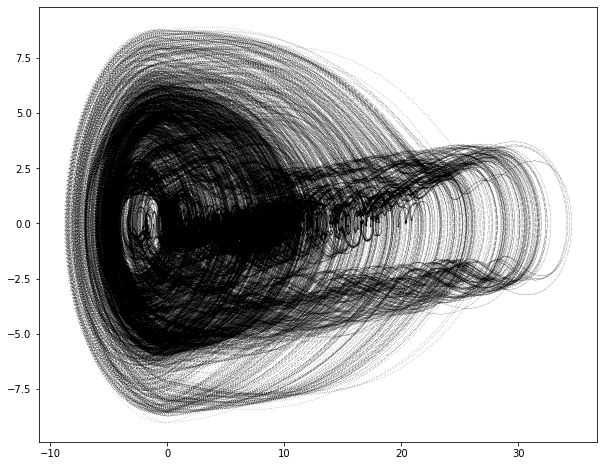

In [8]:
eq = FluidTrampoline()
tpts = np.linspace(0, 20000, 1000000)
ic = (.1, .4, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

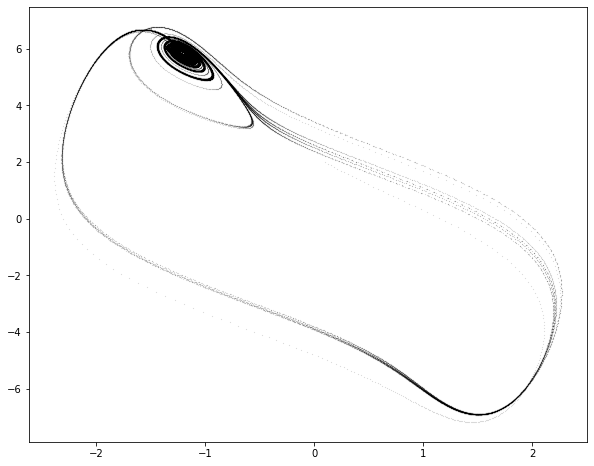

In [96]:
eq = KawczynskiStrizhak(kappa=.2, gamma=.49, mu=2.1)
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 2,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

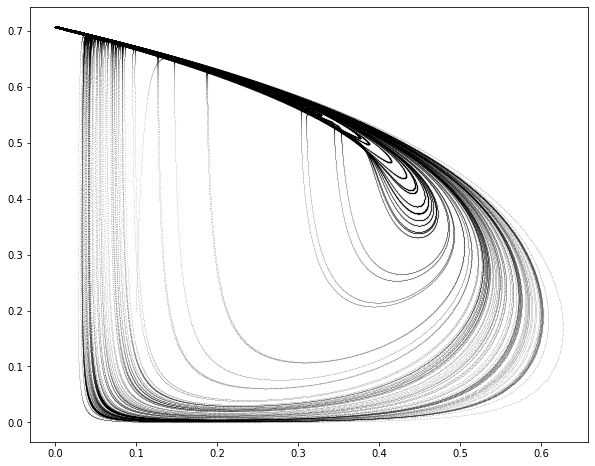

In [21]:
eq = CoevolvingPredatorPrey()
tpts = np.linspace(0, 20000, 1000000)
ic = (.1,.2,.2)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

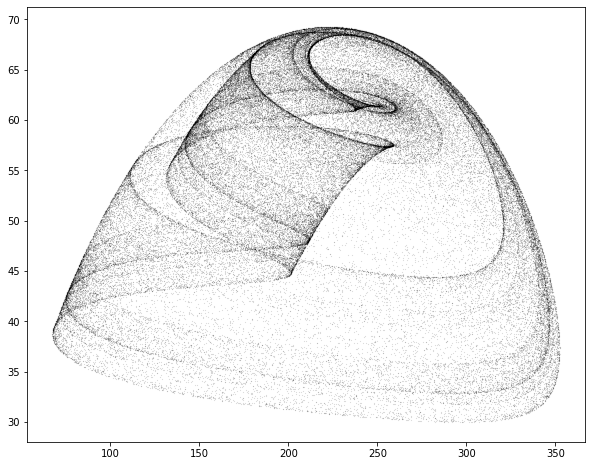

In [6]:
eq = SaltonSea()
tpts = np.linspace(0, 20000, 100000)
ic = (250, 50, 50)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

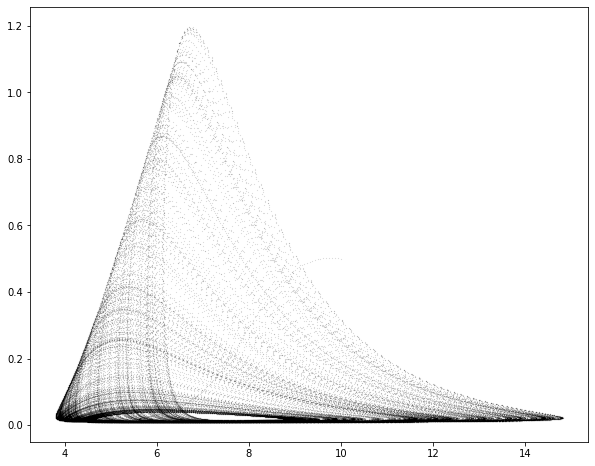

In [90]:
eq = Blasius()
tpts = np.linspace(0, 2000, 100000)
ic = (10, 10, .5)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

In [16]:
class TurchinHanski:
    """
    A chaotic three species food web
    Turchin, Hanski. The American Naturalist 1997
    """
    def __init__(self, r=6, s=1.25, e=1.0, g=1.0, a=10, d=1.0, h=1.0):
        self.r, self.s, self.e, self.g, self.a, self.d, self.h = r, s, e, g, a, d, h
    def __call__(self, X, t):
        """
        The dynamical equation for the system
        - X : tuple corresponding to the three coordinates
        - t : float (the current time)
        """
        n, p, z = X
        ndot = self.r*(1 - self.e*np.sin(z))*n - self.r*(n**2) - self.g*(n**2)/(n**2 + self.h**2) - self.a*n*p/(n + self.d)
        pdot = self.s*(1 - self.e*np.sin(z))*p - self.s*(p**2)/n
        zdot = 2*np.pi
        return (ndot, pdot, zdot) 

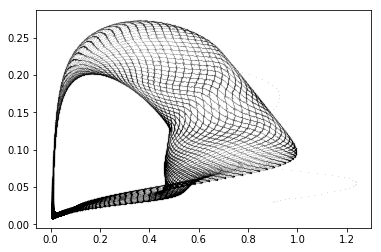

In [31]:
eq = TurchinHanski(r=4.06, s=1.25, e=0.5, g=0.1, a=8, d=0.04, h=0.8)
tpts = np.linspace(0, 2000, 100000)
ic = (.9, .03, 9.5)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

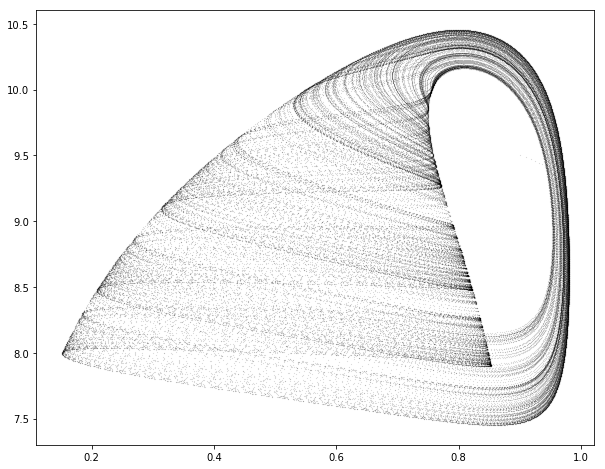

In [7]:
eq = HastingsPowell()
tpts = np.linspace(0, 20000, 100000)
ic = (.9, .03, 9.5)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

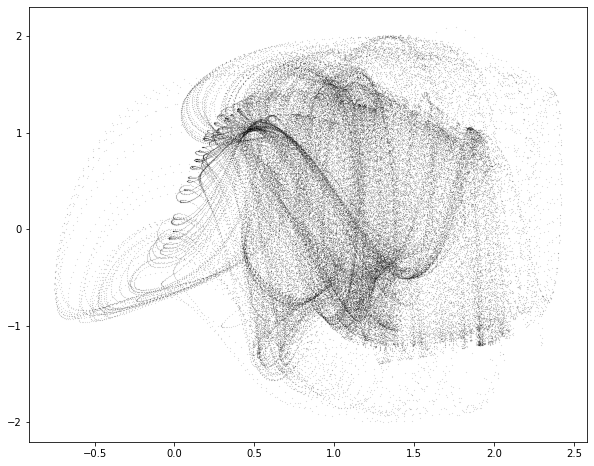

In [18]:
eq = Hadley(f=9)
tpts = np.linspace(0, 2000, 100000)
ic = (.1,.1,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

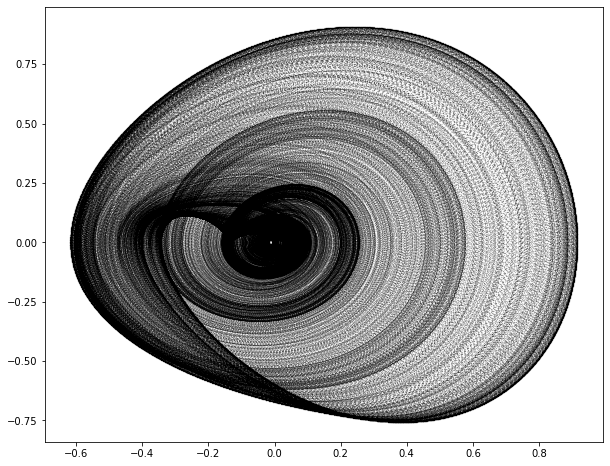

In [3]:
eq = GenesioTesi()
tpts = np.linspace(0, 20000, 1000000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[1], sol[2], '.k', markersize=.1)

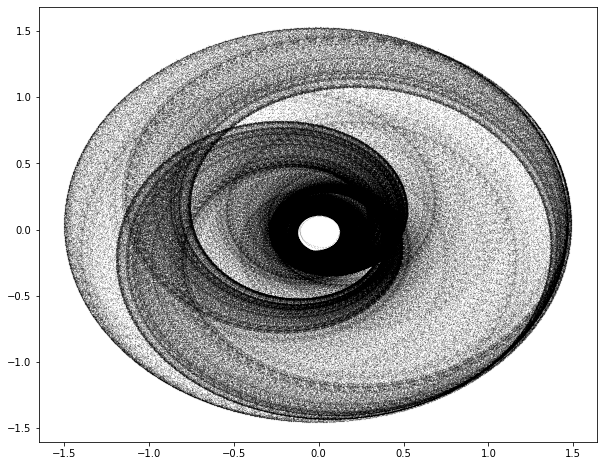

In [4]:
eq = Aizawa()
tpts = np.linspace(0, 20000, 1000000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

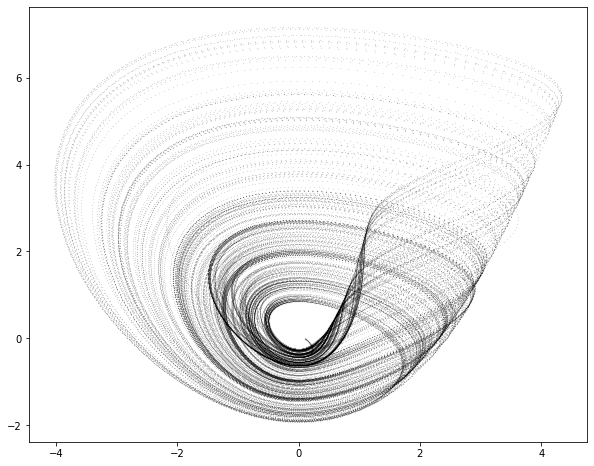

In [13]:
eq = AnishchenkoAstakhov()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 0, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

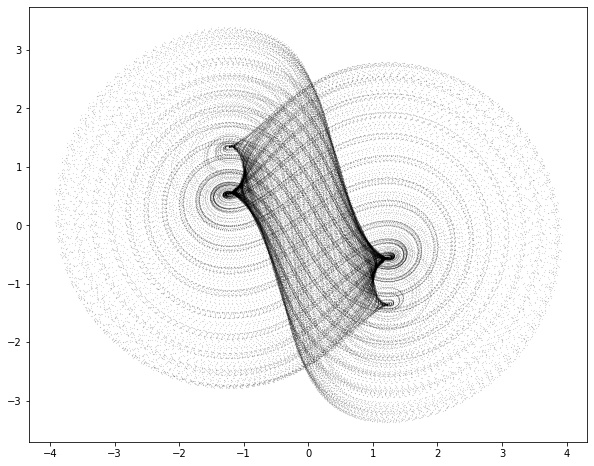

In [2]:
eq = NoseHoover()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 0, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[1], sol[2], '.k', markersize=.1)

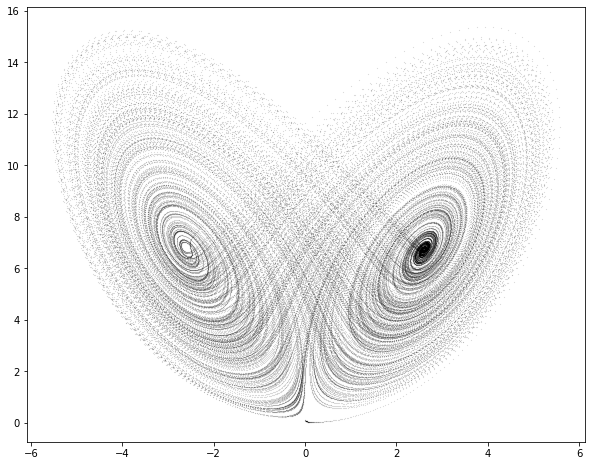

In [12]:
eq = Rucklidge()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 0, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[1], sol[2], '.k', markersize=.1)

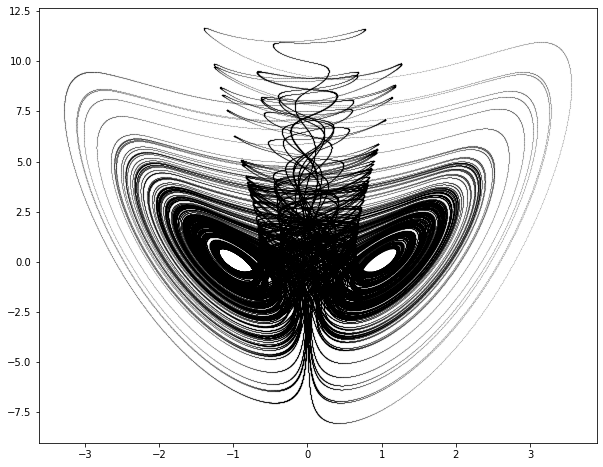

In [2]:
eq = SanUmSrisuchinwong()
tpts = np.linspace(0, 2000, 1000000)
ic = (0.1, 0.1, 0.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

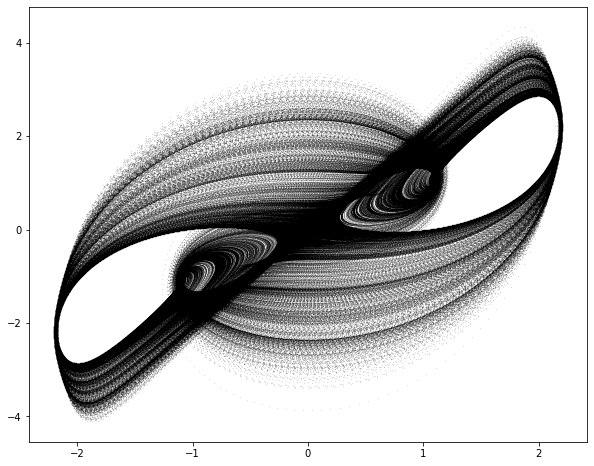

In [8]:
eq = YuWang()
tpts = np.linspace(0, 2000, 1000000)
ic = (0.1, 0.2, 0.2)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

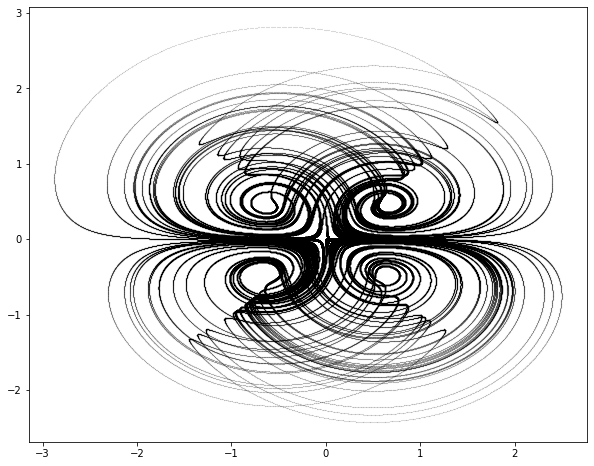

In [12]:
eq = WangSun()
tpts = np.linspace(0, 2000, 1000000)
ic = (0.1, 0.1, 0.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

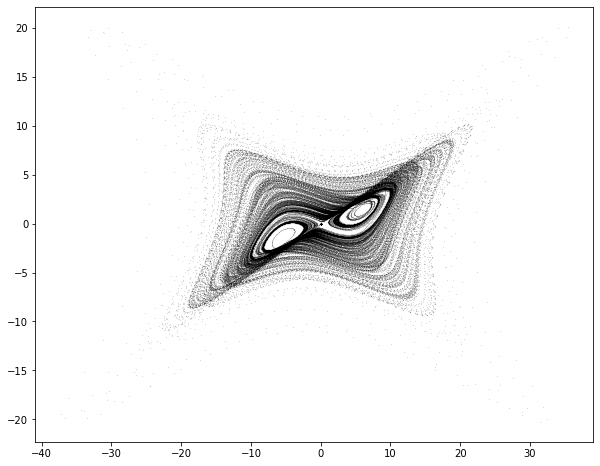

In [2]:
eq = Sakarya()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

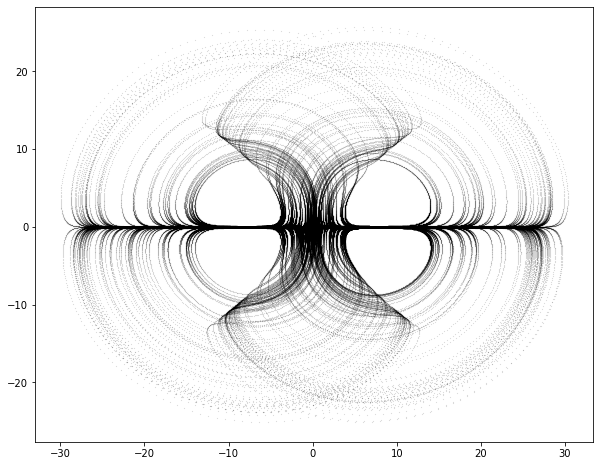

In [3]:
eq = LiuChen()
tpts = np.linspace(0, 2000, 1000000)
ic = (.1, 0.1, 0.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

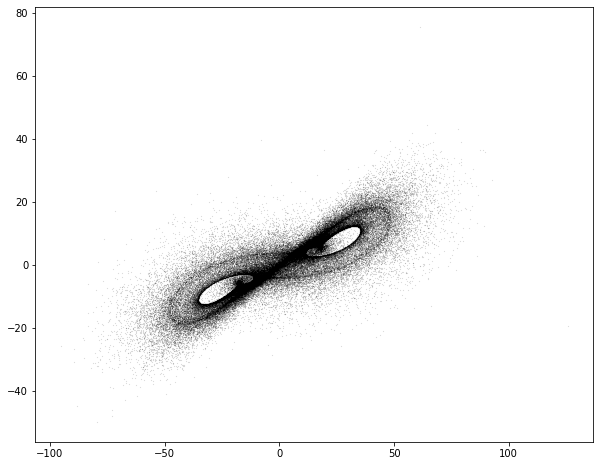

In [7]:
eq = QiChen()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, 0)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

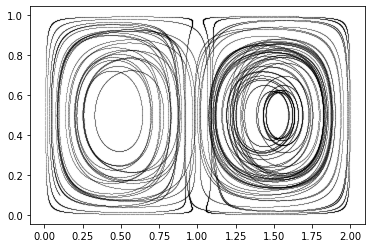

In [15]:
eq = DoubleGyre()
ic = (.1, .1, .1)
tpts = resample_timepoints(eq, ic, np.linspace(0, 200, 100000),  pts_per_period=1000)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

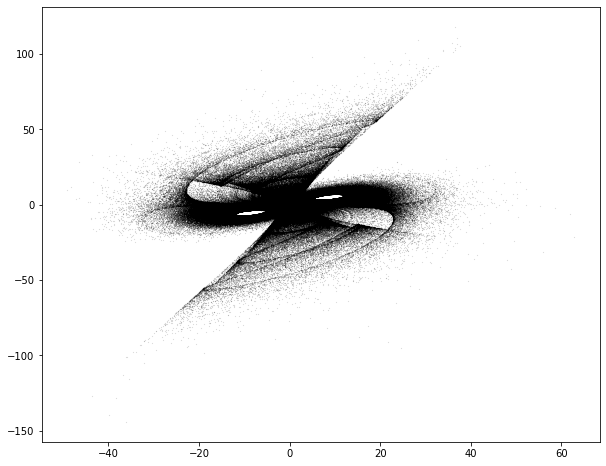

In [8]:
eq = ZhouChen()
tpts = np.linspace(0, 20000, 1000000)
ic = (.1, .1, 0)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

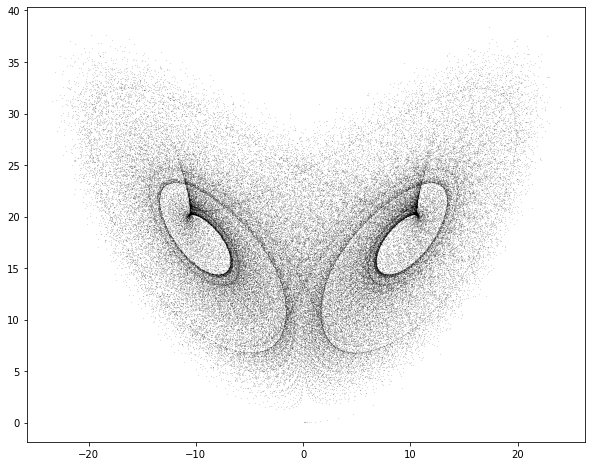

In [17]:
eq = RayleighBenard()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

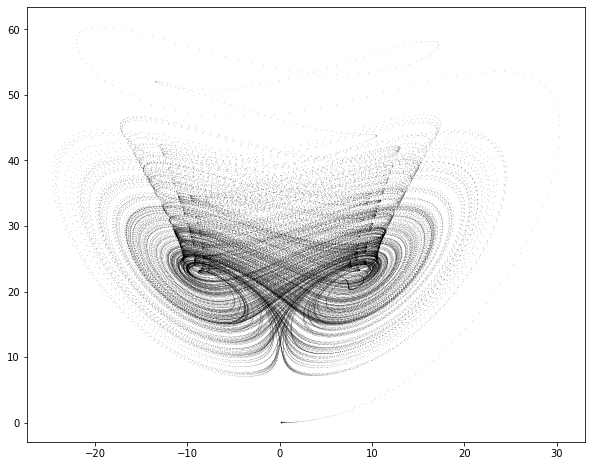

In [9]:
eq = Chen()
tpts = np.linspace(0, 200, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

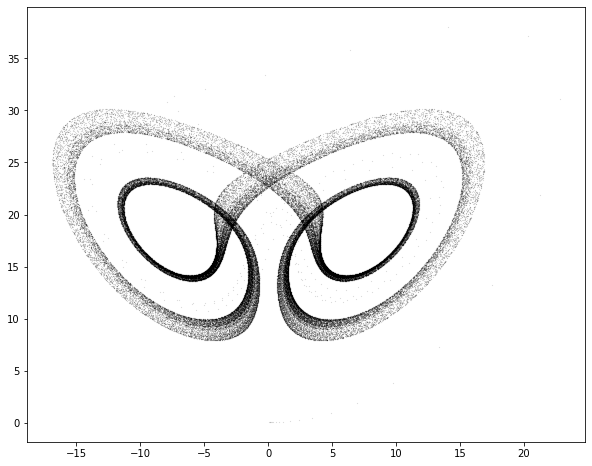

In [10]:
eq = LuChen()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

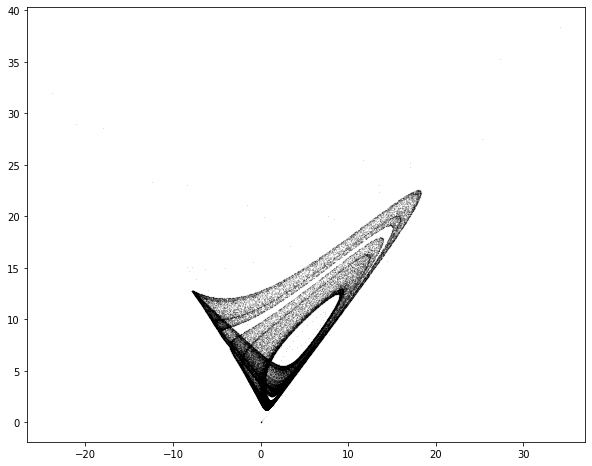

In [56]:
eq = LuChenCheng()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 0, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[1], sol[2], '.k', markersize=.1)

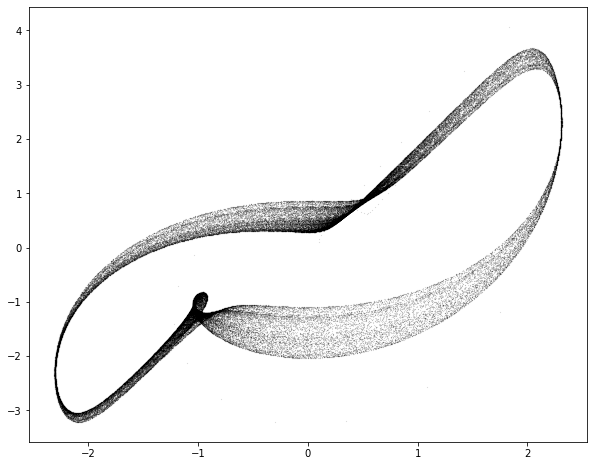

In [3]:
eq = YuWang()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

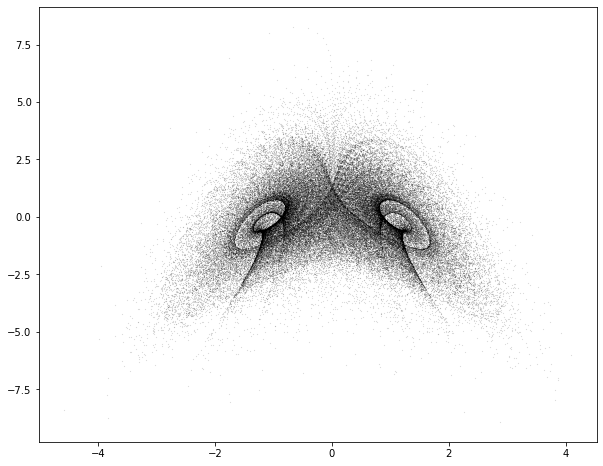

In [4]:
eq = BurkeShaw()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

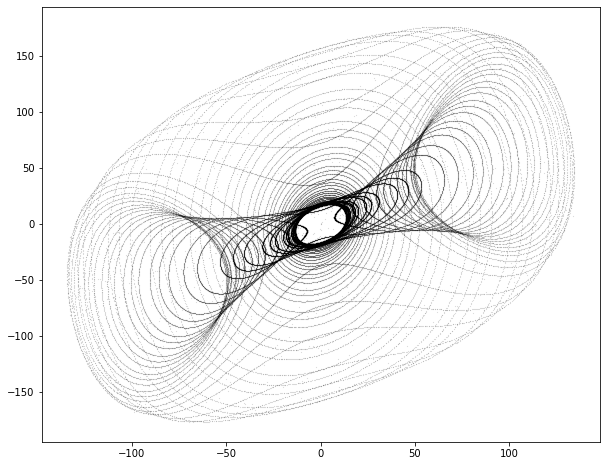

In [102]:
eq = DequanLi()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

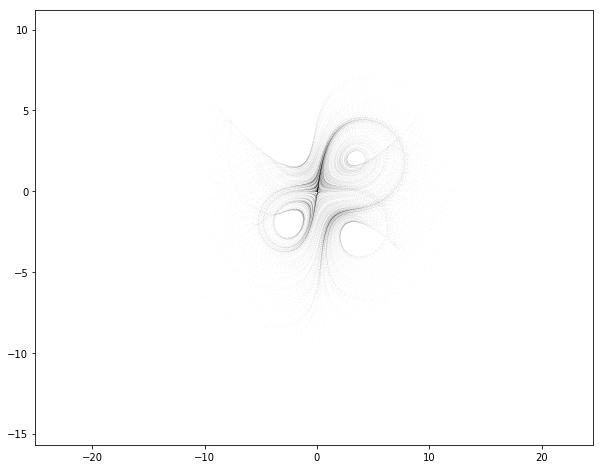

In [4]:
eq = Dadras()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.01)

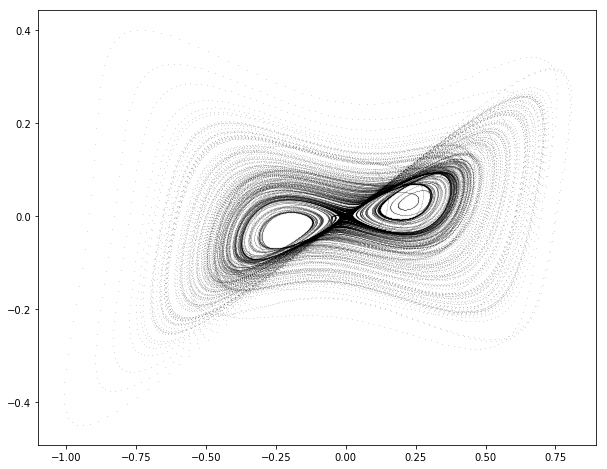

In [5]:
eq = NewtonLiepnik()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

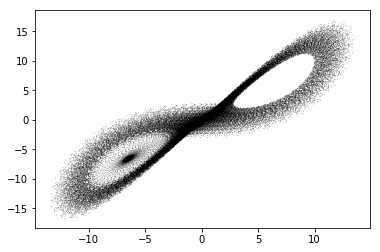

In [7]:
eq = PanXuZhou()
tpts = np.linspace(0, 2000, 100000)
ic = (1, 1, 2)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

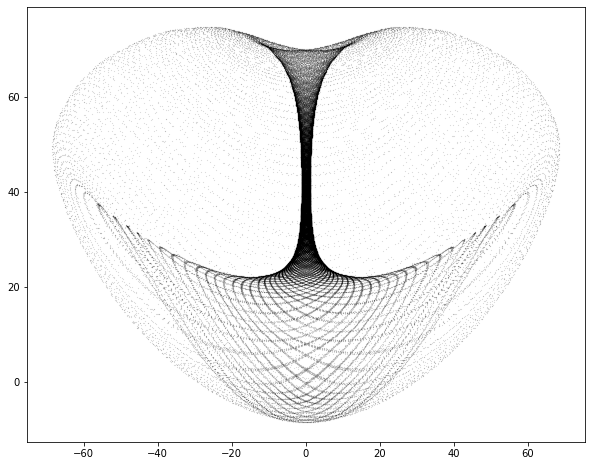

In [8]:
eq = Tsucs2()
tpts = np.linspace(0, 2000, 100000)
ic = (.1,.1,.1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

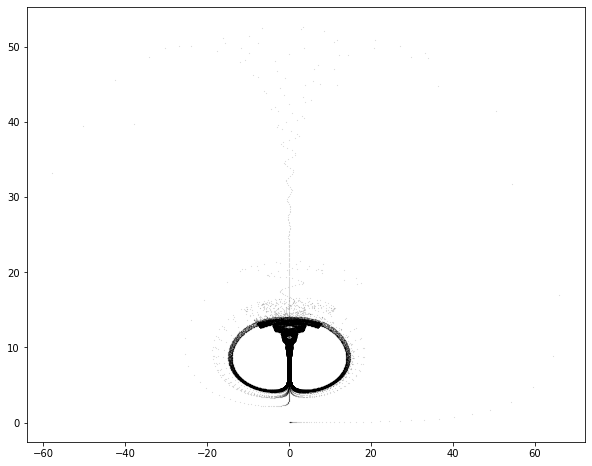

In [21]:
eq = ChenLee()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 0, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

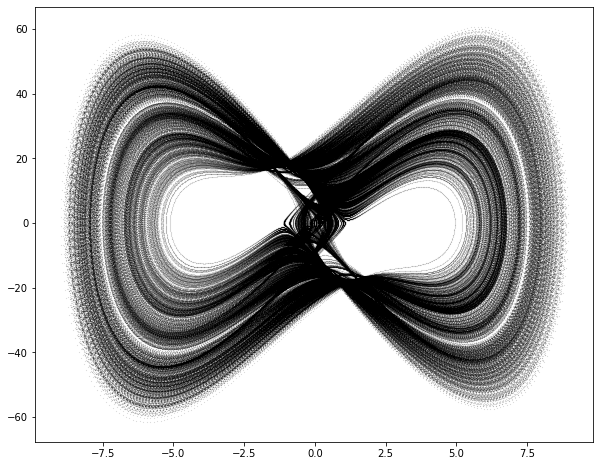

In [11]:
eq = MooreSpiegel()
tpts = np.linspace(0, 2000, 1000000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

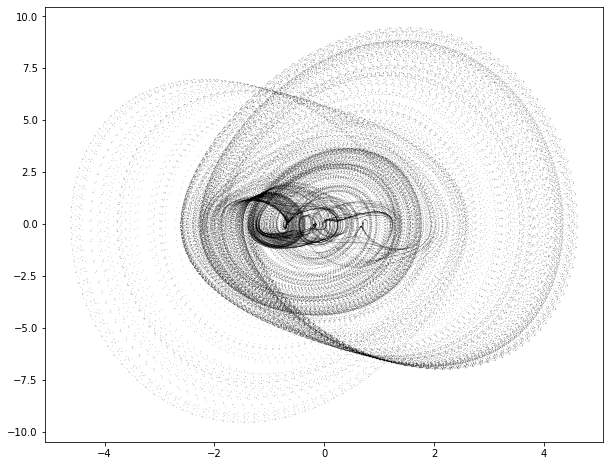

In [9]:
eq = Arneodo()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, 0, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[1], sol[2], '.k', markersize=.1)

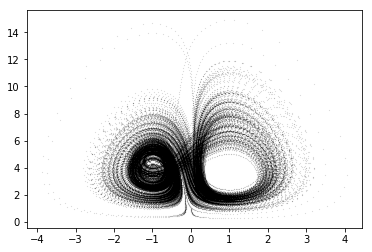

In [2]:
eq = Bouali()
tpts = np.linspace(0, 2000, 100000)
ic = (0, 1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[1], '.k', markersize=.1)

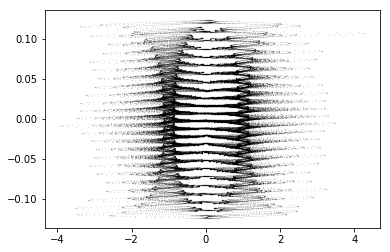

In [54]:
eq = Bouali2()
tpts = np.linspace(0, 2000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

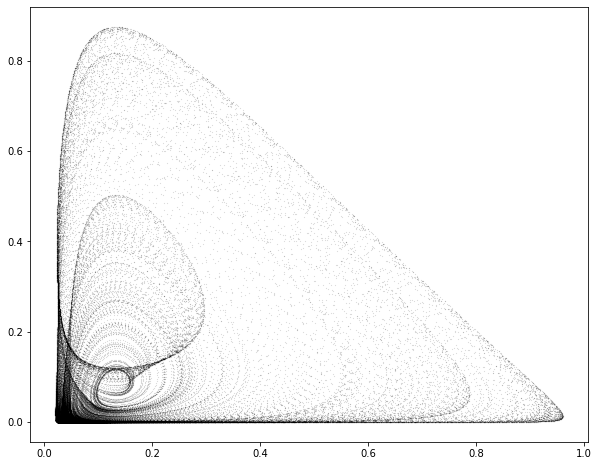

In [10]:
eq = ItikBanksTumor()
tpts = np.linspace(0, 20000, 100000)
ic = (.1, .1, .1)
sol = integrate_dyn(eq, ic, tpts)

plt.plot(sol[0], sol[2], '.k', markersize=.1)

In [27]:
def compute_timescale(a):
    """
    Given sameples of a time series, compute the intrinsic timescale
    """
    pass
    
# insert a control function that takes the current values of all vars and adds forcing

# various functions for sampling from each system, and removing transients

# function that goes to numba

# function that couples attractors together (can use slaving to force chaos)

In [ ]:
#https://stackoverflow.com/questions/1796180/how-can-i-get-a-list-of-all-classes-within-current-module-in-python

In [38]:
import inspect
import sys
clsmembers = inspect.getmembers(sys.modules[__name__], inspect.isclass)
cls_members_narrowed = len([item[1] for item in clsmembers if item[1].__module__ == "chaos_ensemble"])
print(cls_members_narrowed)

90


In [114]:
np.sum(np.abs(data_rp_train[0] - data_loaded[0][0].T))
np.sum(np.abs(data_rp_train[10] - data_loaded[0][10].T))
# np.sum(np.abs(data_rp_train[13] - data_loaded[0][13].T))

# data_rp_train[33] - data_loaded[1][13]
np.sum(np.abs(data_rp_train[33] - data_loaded[1][13].T))

0.0

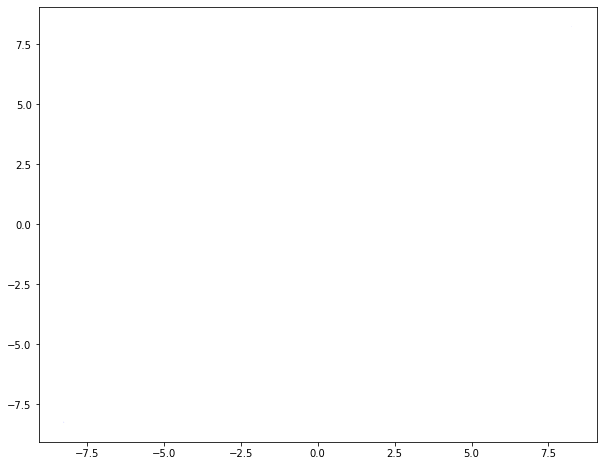

In [73]:
for i in range(10):
#     plt.plot(ee1[1, i][0, :], ee1[1, i][1, :], 'r', linewidth=.01)
    plt.plot(ee1[2, i][0, :], ee1[2, i][1, :], 'b', linewidth=.01)

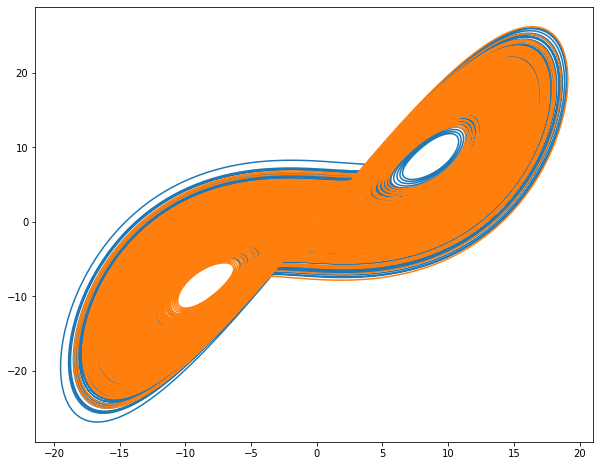

In [33]:
plt.plot(ee1[0, 1][0, :], ee1[0, 1][1, :])
plt.plot(ee1[1, 1][0, :], ee1[1, 1][1, :])

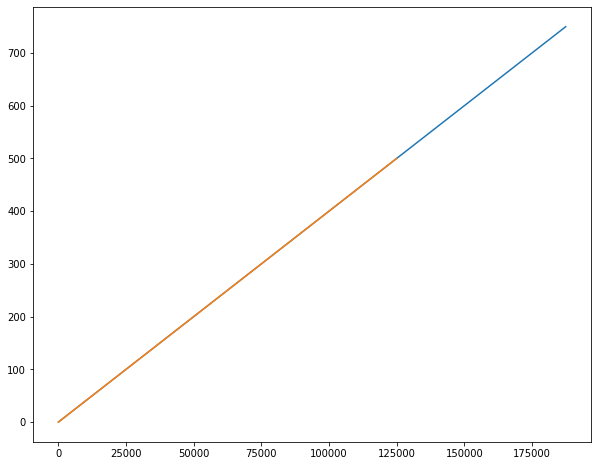

In [18]:
plt.plot(ee1)
plt.plot(np.linspace(0, 500, 125000))

In [42]:
from chaos_models import *

In [43]:
eq = Lorenz(10, 28, 2.667)
sol = eq.integrate((-8.60632853, -14.85273055,  15.53352487), np.linspace(0, 500, 125000))
sol2 = integrate_dyn(eq, (-8.60632853, -14.85273055,  15.53352487), np.linspace(0, 500, 125000))

In [46]:
%timeit integrate_dyn(eq, (-8.60632853, -14.85273055,  15.53352487), np.linspace(0, 500, 125000))
%timeit eq.integrate((-8.60632853, -14.85273055,  15.53352487), np.linspace(0, 500, 125000))

374 ms ± 3.24 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
381 ms ± 5.05 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
# Lorenz less data
SAMPLE_WINDOW = 5000
TRAIN_TIME = 200
eq = Lorenz(10, 28, 2.667)
sol = eq.integrate((-8.60632853, -14.85273055,  15.53352487), np.linspace(0, 500, 125000))
sol = sol[:,::10]
data = sol[0]

plt.figure()
plt.plot(sol[0], sol[1], linewidth=.1)


eq = Lorenz(9, 26, 2.5)
sol = eq.integrate((-8.60632853, -14.85273055,  15.53352487), np.linspace(0, 500, 125000))
sol = sol[:,::10]
data = sol[0]
plt.figure()
plt.plot(sol[0], sol[1], 'r', linewidth=.1)

In [47]:
eq.get_params()
# A method that returns the ODE parameters for the system

In [ ]:
## Some day have an API working

import inspect


def generate_data(model, n_samples, params, frac_perturb_param=.1, 
                             n_classes=2, frac_transient=0.1, 
                             ic_range=None,
                            random_state=0):
    """
    Generate an ensemble of trajectories with random initial conditions, labelled by different
    sets of parameters.

    model : an instantiation of a dynamical system
    tpts : the timesteps over which to run the simulation
    params : iterable, the starting values for the parameters
    n_samples : int, the number of different initial conditons
    n_classes : int , the number of different parameters
    frac_perturb_param : float, the amount to perturb the parameters by
    frac_transient : float, the fraction of time for the time series to settle onto the attractor
    ic_range : a starting value for the initial conditions
    random_state : int, the seed for the random number generator
    """

    num_per_class = int(n_samples/n_classes)

    params = inspect.getfullargspec(model.__init__).defaults # get default values of params
    
    params = model.get_params()

    param_fractional_perturb = frac_perturb*2*(np.random(len(model.default_params)) - 0.5)
    params = model.default_params*param_fractional_perturb

    mod = model(*params)
    
    
    
    
    np.random.seed(random_state)
    
    ntpts = len(tpts0)
    dt = tpts0[1] - tpts0[0]
    t_range = tpts0[-1] - tpts0[0]
    tpts = np.arange(tpts0[0], tpts0[0] + t_range*(1 + frac_transient), dt)
    
    all_params = list()
    all_samples = list()
    for i in range(n_classes):
    
        params_perturb = 1 + frac_perturb_param*(2*np.random.random(len(params)) - 1)
        params_prime = params*params_perturb
        all_params.append(params_prime)
    
        eq = Lorenz(*params_prime)
        
        all_samples_per_class = list()
        for j in range(num_per_class):
            ic_prime = (-8.60632853, -14.85273055,  15.53352487)*np.random.random(3)
            sol = integrate_dyn(eq, ic_prime, tpts)
            
            all_samples_per_class.append(sol[:, -ntpts:]) # remove transient
        all_samples.append(all_samples_per_class)
    
    all_samples, all_params = np.array(all_samples), np.array(all_params)
    return all_samples, all_params